In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import datetime as dt
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectKBest
from numpy import array 
from plotly import express as px
from sklearn.metrics import r2_score

import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import PowerTransformer, KBinsDiscretizer, OneHotEncoder
from scipy import stats
from sklearn.linear_model import SGDRegressor, Lasso, Ridge
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from datetime import datetime
from functools import partial

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lars
from sklearn.linear_model import SGDRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

In [2]:
df=pd.read_csv('kc_house_dataDS.csv', index_col=0, decimal='.')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 131994 entries, 0 to 131993
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   index          131994 non-null  int64 
 1   zipcode        127587 non-null  object
 2   grade          127517 non-null  object
 3   sqft_basement  127488 non-null  object
 4   view           127654 non-null  object
 5   bathrooms      127489 non-null  object
 6   bedrooms       127529 non-null  object
 7   sqft_above     127512 non-null  object
 8   sqft_living15  127614 non-null  object
 9   lat            127531 non-null  object
 10  waterfront     127530 non-null  object
 11  floors         127591 non-null  object
 12  date           127544 non-null  object
 13  yr_renovated   127528 non-null  object
 14  yr_built       127512 non-null  object
 15  long           127560 non-null  object
 16  jhygtf         127528 non-null  object
 17  sqft_lot       127563 non-null  object
 18  pric

In [4]:
df.sample(5)

,index,zipcode,grade,sqft_basement,view,bathrooms,bedrooms,sqft_above,sqft_living15,lat,...,yr_renovated,yr_built,long,jhygtf,sqft_lot,price,condition,wertyj,sqft_lot15,sqft_living
81119,18734,98103.0,8.0,130.0,0.0,2.25,2.0,1010.0,1140.0,47659.0,...,874456765456.0,874456765456.0,-122346.0,874456765456.0,1184.0,399950.0,3.0,876543,874456765456.0,1140.0
45779,10691,98030.0,??,0.0,0.0,3.0,4.0,??,??,??,...,0.0,1991.0,??,0.0,52983.0,460000.0,3.0,876543,8755.0,??
70044,1707,98155.0,7.0,350.0,0.0,1.5,3.0,1290.0,1640.0,47.7443,...,0.0,1958.0,-122327.0,0.0,8301.0,365000.0,3.0,876543,8955.0,1640.0
96241,859,98042.0,7.0,0.0,NaN,NaN,3.0,1150.0,NaN,47.3729,...,0.0,1977.0,-122115.0,0.0,NaN,166600.0,4.0,876543,7040.0,1150.0
4270,7780,98166.0,8.0,660.0,0.0,2.0,3.0,1840.0,2500.0,874456765456.0,...,0.0,1954.0,-122337.0,0.0,30056.0,575000.0,5.0,876543,30000.0,2500.0


In [5]:
df.isnull().sum()

index               0
zipcode          4407
grade            4477
sqft_basement    4506
view             4340
bathrooms        4505
bedrooms         4465
sqft_above       4482
sqft_living15    4380
lat              4463
waterfront       4464
floors           4403
date             4450
yr_renovated     4466
yr_built         4482
long             4434
jhygtf           4466
sqft_lot         4431
price            4533
condition        4454
wertyj              0
sqft_lot15       4455
sqft_living      4426
dtype: int64

In [6]:
df.columns

Index(['index', 'zipcode', 'grade', 'sqft_basement', 'view', 'bathrooms',
       'bedrooms', 'sqft_above', 'sqft_living15', 'lat', 'waterfront',
       'floors', 'date', 'yr_renovated', 'yr_built', 'long', 'jhygtf',
       'sqft_lot', 'price', 'condition', 'wertyj', 'sqft_lot15',
       'sqft_living'],
      dtype='object')

In [7]:
numerica=[x for x in df.columns if x != 'date']

In [8]:
numerica

['index',
 'zipcode',
 'grade',
 'sqft_basement',
 'view',
 'bathrooms',
 'bedrooms',
 'sqft_above',
 'sqft_living15',
 'lat',
 'waterfront',
 'floors',
 'yr_renovated',
 'yr_built',
 'long',
 'jhygtf',
 'sqft_lot',
 'price',
 'condition',
 'wertyj',
 'sqft_lot15',
 'sqft_living']

In [9]:
for numerica in numerica:
    df[numerica]=pd.to_numeric(df[numerica],errors='coerce')

In [10]:
df.groupby('index')['index'].count()

index
0        6
1        6
2        6
3        6
4        6
        ..
21994    6
21995    6
21996    6
21997    6
21998    6
Name: index, Length: 21999, dtype: int64

In [11]:
numericas=[x for x in df.columns if x != 'date']
for numericas in numericas:
    df[numericas]=df[numericas].fillna(df.groupby('index')[numericas].transform('median'))

In [12]:
numericas=[x for x in df.columns if x != 'date' and x != 'long' ]
for numericas in numericas:
    df = df.drop(df[df[numericas]<0].index)

In [13]:
df.shape

(110232, 23)

In [14]:
df[df['index']==0]

,index,zipcode,grade,sqft_basement,view,bathrooms,bedrooms,sqft_above,sqft_living15,lat,...,yr_renovated,yr_built,long,jhygtf,sqft_lot,price,condition,wertyj,sqft_lot15,sqft_living
24891,0,8.744568e+11,7.0,0.0,0.0,1.0,3.0,1180.0,1340.0,8.744568e+11,...,0.0,1955.0,-122257.0,0.0,5650.0,221900.0,3.0,876543,8.744568e+11,8.744568e+11
27240,0,9.817800e+04,7.0,0.0,0.0,1.0,3.0,1180.0,1340.0,4.751120e+01,...,0.0,1955.0,-122257.0,0.0,5650.0,221900.0,3.0,876543,5.650000e+03,1.180000e+03
44480,0,9.817800e+04,7.0,0.0,0.0,1.0,3.0,1180.0,1340.0,4.751120e+01,...,0.0,1955.0,-122257.0,0.0,5650.0,221900.0,3.0,876543,5.650000e+03,1.180000e+03
59332,0,9.817800e+04,7.0,0.0,0.0,1.0,3.0,1180.0,1340.0,4.751120e+01,...,0.0,1955.0,-122257.0,0.0,5650.0,221900.0,3.0,876543,5.650000e+03,1.180000e+03
89550,0,9.817800e+04,7.0,0.0,0.0,1.0,3.0,1180.0,1340.0,4.751120e+01,...,0.0,1955.0,-122257.0,0.0,5650.0,221900.0,3.0,876543,5.650000e+03,1.180000e+03


In [15]:
df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [16]:
numericas=[x for x in df.columns if x != 'date' ]
df[numericas] = df[numericas].where(lambda x: x > -1e+10, other=np.nan).where(lambda x: x < 1e+10, other=np.nan)

In [17]:
numericas=[x for x in df.columns if x != 'date']
for numericas in numericas:
    df[numericas]=df[numericas].fillna(df.groupby('index')[numericas].transform('median'))

In [18]:
df['date'] = df['date'].fillna(df.groupby(['index'], sort=False)['date'].apply(lambda x: x.ffill().bfill()))

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\4167510020.py:1: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df['date'] = df['date'].fillna(df.groupby(['index'], sort=False)['date'].apply(lambda x: x.ffill().bfill()))


In [19]:
df.shape

(110232, 23)

In [20]:
#este se puede cambiar antes de hacer la division 

df=df.drop_duplicates()



In [21]:
df.shape

(21972, 23)

In [22]:
df.isnull().sum()

index             0
zipcode           9
grade             6
sqft_basement     2
view              4
bathrooms         7
bedrooms          1
sqft_above       10
sqft_living15     0
lat               4
waterfront        5
floors            6
date              2
yr_renovated      7
yr_built          4
long              3
jhygtf            7
sqft_lot          3
price            22
condition         2
wertyj            0
sqft_lot15        1
sqft_living       6
dtype: int64

array([[<AxesSubplot: title={'center': 'index'}>,
        <AxesSubplot: title={'center': 'zipcode'}>,
        <AxesSubplot: title={'center': 'grade'}>,
        <AxesSubplot: title={'center': 'sqft_basement'}>,
        <AxesSubplot: title={'center': 'view'}>],
       [<AxesSubplot: title={'center': 'bathrooms'}>,
        <AxesSubplot: title={'center': 'bedrooms'}>,
        <AxesSubplot: title={'center': 'sqft_above'}>,
        <AxesSubplot: title={'center': 'sqft_living15'}>,
        <AxesSubplot: title={'center': 'lat'}>],
       [<AxesSubplot: title={'center': 'waterfront'}>,
        <AxesSubplot: title={'center': 'floors'}>,
        <AxesSubplot: title={'center': 'date'}>,
        <AxesSubplot: title={'center': 'yr_renovated'}>,
        <AxesSubplot: title={'center': 'yr_built'}>],
       [<AxesSubplot: title={'center': 'long'}>,
        <AxesSubplot: title={'center': 'jhygtf'}>,
        <AxesSubplot: title={'center': 'sqft_lot'}>,
        <AxesSubplot: title={'center': 'price'}>,
  

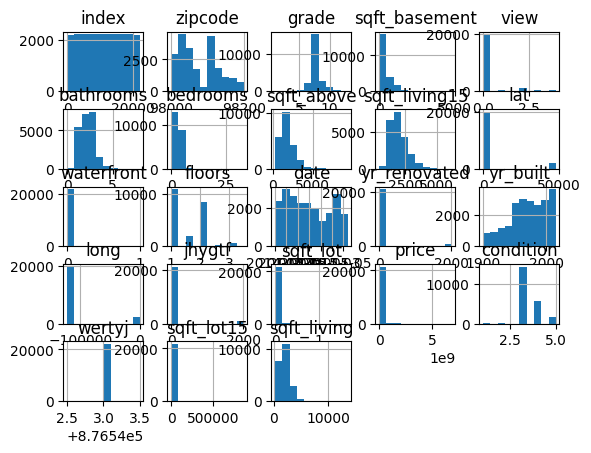

In [23]:
df.hist()

In [24]:
df.drop(['wertyj'], axis=1, inplace=True)

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\3782103001.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(['wertyj'], axis=1, inplace=True)


In [25]:
df.corr()

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,index,zipcode,grade,sqft_basement,view,bathrooms,bedrooms,sqft_above,sqft_living15,lat,...,floors,yr_renovated,yr_built,long,jhygtf,sqft_lot,price,condition,sqft_lot15,sqft_living
index,1.000000,-0.004998,0.078784,-0.040765,-0.016086,0.102498,0.013721,0.070019,0.027899,0.007606,...,0.171396,-0.024681,0.192424,-0.003687,-0.024681,-0.025959,-0.001680,-0.091703,-0.027911,0.043797
zipcode,-0.004998,1.000000,-0.184056,0.075984,0.085785,-0.203305,-0.151964,-0.260357,-0.278363,0.003539,...,-0.059713,0.062678,-0.346709,0.013828,0.062678,-0.129803,-0.023723,0.003626,-0.147075,-0.198145
grade,0.078784,-0.184056,1.000000,0.166491,0.249547,0.664936,0.356119,0.755742,0.712814,-0.005854,...,0.458724,0.013814,0.446724,0.005239,0.013814,0.113797,0.297167,-0.143872,0.119606,0.762229
sqft_basement,-0.040765,0.075984,0.166491,1.000000,0.274670,0.282034,0.302280,-0.053599,0.198770,0.001265,...,-0.247155,0.070237,-0.133279,0.016354,0.070237,0.015899,0.157274,0.172794,0.017854,0.433735
view,-0.016086,0.085785,0.249547,0.274670,1.000000,0.187455,0.079348,0.166487,0.279745,-0.002865,...,0.028981,0.103601,-0.053652,0.006427,0.103601,0.074066,0.216710,0.045778,0.071937,0.282575
bathrooms,0.102498,-0.203305,0.664936,0.282034,0.187455,1.000000,0.514779,0.685061,0.569286,0.002039,...,0.500480,0.050492,0.506115,0.007082,0.050492,0.088165,0.230969,-0.124082,0.087847,0.754177
bedrooms,0.013721,-0.151964,0.356119,0.302280,0.079348,0.514779,1.000000,0.477201,0.391304,0.005866,...,0.175541,0.018391,0.153839,0.006271,0.018391,0.030956,0.121749,0.027321,0.028783,0.576423
sqft_above,0.070019,-0.260357,0.755742,-0.053599,0.166487,0.685061,0.477201,1.000000,0.732057,0.004329,...,0.524988,0.023050,0.424655,0.007003,0.023050,0.183298,0.269779,-0.157682,0.194391,0.876405
sqft_living15,0.027899,-0.278363,0.712814,0.198770,0.279745,0.569286,0.391304,0.732057,1.000000,0.001635,...,0.281293,-0.002265,0.327055,0.006147,-0.002265,0.146482,0.253546,-0.093987,0.184441,0.756597
lat,0.007606,0.003539,-0.005854,0.001265,-0.002865,0.002039,0.005866,0.004329,0.001635,1.000000,...,-0.001549,0.011804,-0.001980,-0.001454,0.011804,0.007517,-0.005405,0.002600,0.006638,0.004843


In [26]:
df['year']=df['date'].dt.year



C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\3749158286.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year']=df['date'].dt.year


In [27]:
df['month']=df['date'].dt.month

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\4289079944.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month']=df['date'].dt.month


In [28]:
df.drop(['date'], axis=1, inplace=True)

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\2727894653.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(['date'], axis=1, inplace=True)


In [29]:
df.corr()

,index,zipcode,grade,sqft_basement,view,bathrooms,bedrooms,sqft_above,sqft_living15,lat,...,yr_built,long,jhygtf,sqft_lot,price,condition,sqft_lot15,sqft_living,year,month
index,1.000000,-0.004998,0.078784,-0.040765,-0.016086,0.102498,0.013721,0.070019,0.027899,0.007606,...,0.192424,-0.003687,-0.024681,-0.025959,-0.001680,-0.091703,-0.027911,0.043797,-0.001015,0.001707
zipcode,-0.004998,1.000000,-0.184056,0.075984,0.085785,-0.203305,-0.151964,-0.260357,-0.278363,0.003539,...,-0.346709,0.013828,0.062678,-0.129803,-0.023723,0.003626,-0.147075,-0.198145,-0.000412,0.001343
grade,0.078784,-0.184056,1.000000,0.166491,0.249547,0.664936,0.356119,0.755742,0.712814,-0.005854,...,0.446724,0.005239,0.013814,0.113797,0.297167,-0.143872,0.119606,0.762229,-0.029230,0.007570
sqft_basement,-0.040765,0.075984,0.166491,1.000000,0.274670,0.282034,0.302280,-0.053599,0.198770,0.001265,...,-0.133279,0.016354,0.070237,0.015899,0.157274,0.172794,0.017854,0.433735,-0.015778,0.005310
view,-0.016086,0.085785,0.249547,0.274670,1.000000,0.187455,0.079348,0.166487,0.279745,-0.002865,...,-0.053652,0.006427,0.103601,0.074066,0.216710,0.045778,0.071937,0.282575,0.001066,-0.005251
bathrooms,0.102498,-0.203305,0.664936,0.282034,0.187455,1.000000,0.514779,0.685061,0.569286,0.002039,...,0.506115,0.007082,0.050492,0.088165,0.230969,-0.124082,0.087847,0.754177,-0.026490,0.007407
bedrooms,0.013721,-0.151964,0.356119,0.302280,0.079348,0.514779,1.000000,0.477201,0.391304,0.005866,...,0.153839,0.006271,0.018391,0.030956,0.121749,0.027321,0.028783,0.576423,-0.009353,-0.002862
sqft_above,0.070019,-0.260357,0.755742,-0.053599,0.166487,0.685061,0.477201,1.000000,0.732057,0.004329,...,0.424655,0.007003,0.023050,0.183298,0.269779,-0.157682,0.194391,0.876405,-0.023180,0.009365
sqft_living15,0.027899,-0.278363,0.712814,0.198770,0.279745,0.569286,0.391304,0.732057,1.000000,0.001635,...,0.327055,0.006147,-0.002265,0.146482,0.253546,-0.093987,0.184441,0.756597,-0.020339,0.001455
lat,0.007606,0.003539,-0.005854,0.001265,-0.002865,0.002039,0.005866,0.004329,0.001635,1.000000,...,-0.001980,-0.001454,0.011804,0.007517,-0.005405,0.002600,0.006638,0.004843,-0.008239,0.003778


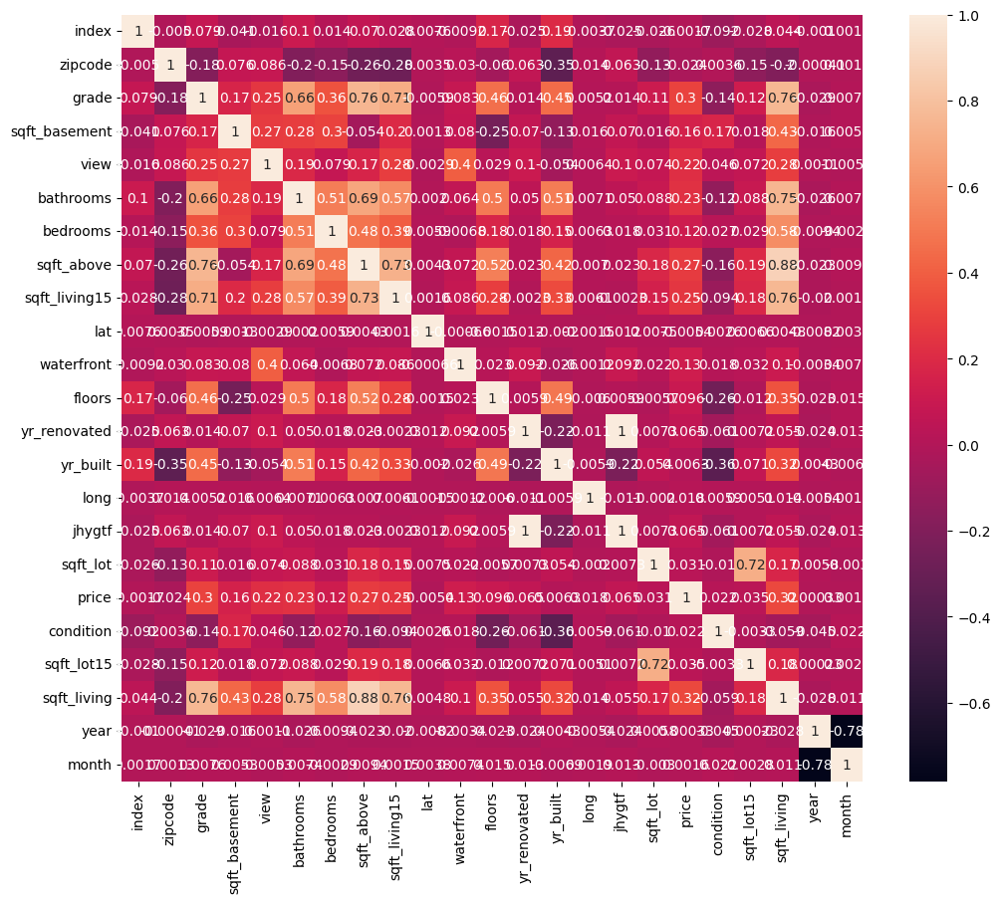

In [30]:
fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(df.corr(), annot=True);

In [31]:
train_test, validation = train_test_split(df, test_size=0.2, random_state=1)

In [32]:
train_test.shape

(17577, 23)

In [33]:
validation.shape

(4395, 23)

In [34]:
df=train_test
df2=train_test
df3=train_test
df4=train_test
df5=train_test

In [35]:
df.isnull().sum()

index             0
zipcode           7
grade             5
sqft_basement     2
view              4
bathrooms         5
bedrooms          0
sqft_above        9
sqft_living15     0
lat               4
waterfront        4
floors            6
yr_renovated      5
yr_built          4
long              3
jhygtf            5
sqft_lot          1
price            16
condition         2
sqft_lot15        0
sqft_living       4
year              2
month             2
dtype: int64

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17577 entries, 7551 to 281
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   index          17577 non-null  int64  
 1   zipcode        17570 non-null  float64
 2   grade          17572 non-null  float64
 3   sqft_basement  17575 non-null  float64
 4   view           17573 non-null  float64
 5   bathrooms      17572 non-null  float64
 6   bedrooms       17577 non-null  float64
 7   sqft_above     17568 non-null  float64
 8   sqft_living15  17577 non-null  float64
 9   lat            17573 non-null  float64
 10  waterfront     17573 non-null  float64
 11  floors         17571 non-null  float64
 12  yr_renovated   17572 non-null  float64
 13  yr_built       17573 non-null  float64
 14  long           17574 non-null  float64
 15  jhygtf         17572 non-null  float64
 16  sqft_lot       17576 non-null  float64
 17  price          17561 non-null  float64
 18  condi

In [37]:
datosF=[columna for columna in df.columns]
df=df.dropna(subset=datosF)

In [38]:
X=df.drop(['price'], axis=1)
y=df['price']

best=SelectKBest(k=10)
features = array(X.columns)
features

X_new = best.fit_transform(X, y)

filter_1 = best.get_support()
print(features[filter_1])

['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 'sqft_living15' 'waterfront' 'floors' 'sqft_living']


In [39]:
#regresion lenal antes de hacer imputacion de outliers

X = df[['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors', 'sqft_living']]
Y = df['price']

In [40]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)



In [41]:
linear_model = LinearRegression(normalize=True).fit(x_train, y_train)
print('Puntaje de entrenamiento: ', linear_model.score(x_train, y_train))

Puntaje de entrenamiento:  0.12292598557847689


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


In [42]:
y_pred = linear_model.predict(x_test)
print('Puntaje de Testing: ', r2_score(y_test, y_pred))

Puntaje de Testing:  0.11800351261942077


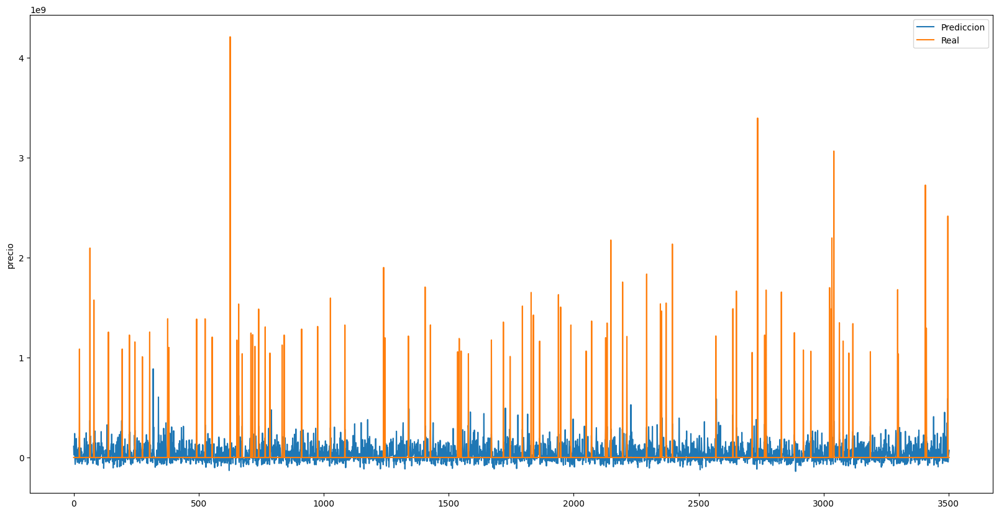

In [43]:
plt.figure(figsize = (20,10))

plt.plot(y_pred, label='Prediccion')
plt.plot(y_test.values, label='Real')

plt.ylabel('precio')

plt.legend()
plt.show()


In [44]:

df.groupby('bedrooms')['bedrooms'].count()

bedrooms
0.0        9
1.0      167
2.0     2216
3.0     7934
4.0     5619
5.0     1298
6.0      223
7.0       28
8.0        8
9.0        5
10.0       3
11.0       1
Name: bedrooms, dtype: int64

In [45]:
df.loc[df.bedrooms<=3,'bedrooms']=1
df.loc[(df.bedrooms>=4)&(df.bedrooms<=7),'bedrooms']=2
df.loc[(df.bedrooms>=8),'bedrooms']=3

In [46]:
df.groupby('bedrooms')['bedrooms'].count()

bedrooms
1.0    10326
2.0     7168
3.0       17
Name: bedrooms, dtype: int64

In [47]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='grade', 
       title='grade')


In [48]:
df.groupby('grade')['grade'].count()

grade
3.0        2
4.0       25
5.0      198
6.0     1629
7.0     7261
8.0     4930
9.0     2136
10.0     925
11.0     322
12.0      74
13.0       9
Name: grade, dtype: int64

In [49]:
df.loc[df.grade<=6,'grade']=1
df.loc[(df.grade>=7)&(df.grade<=8),'grade']=2
df.loc[(df.grade>=9),'grade']=3

In [50]:
df.groupby('grade')['grade'].count()

grade
1.0     1854
2.0    12191
3.0     3466
Name: grade, dtype: int64

In [51]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_basement', 
       title='sqft_basement')

In [52]:
df['sqft_basement'].describe()

count    17511.000000
mean       292.000057
std        442.757247
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       4130.000000
Name: sqft_basement, dtype: float64

In [53]:
df.loc[df.sqft_basement==0,'sqft_basement']=0
df.loc[(df.sqft_basement>=1),'sqft_basement']=1


In [54]:
px.box(df, x='view', 
       title='view')

In [55]:
df.groupby('view')['view'].count()

view
0.0    15809
1.0      263
2.0      775
3.0      409
4.0      255
Name: view, dtype: int64

In [56]:
df.loc[df.view==0,'view']=0
df.loc[(df.view>=1),'view']=1

In [57]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='bathrooms', 
       title='bathrooms')

In [58]:
df.groupby('bathrooms')['bathrooms'].count()

bathrooms
0.00       4
0.50       3
0.75      59
1.00    3109
1.25       8
1.50    1203
1.75    2454
2.00    1563
2.25    1671
2.50    4342
2.75     981
3.00     609
3.25     472
3.50     583
3.75     120
4.00     112
4.25      67
4.50      84
4.75      16
5.00      18
5.25      12
5.50       8
5.75       3
6.00       4
6.25       1
6.50       2
7.50       1
8.00       2
Name: bathrooms, dtype: int64

In [59]:
df.loc[df.bathrooms<=4,'bathrooms']=1
df.loc[(df.bathrooms>=3),'bathrooms']=2


In [60]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_above', 
       title='sqft_above')

In [61]:
df.loc[df.sqft_above<=1560,'sqft_above']=1
df.loc[(df.sqft_above>=1561)&(df.sqft_above<=3720),'sqft_above']=2
df.loc[(df.sqft_above>=3721),'sqft_above']=3

In [62]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_living15', 
       title='sqft_living15')

In [63]:
df.loc[df.sqft_living15<=1840,'sqft_living15']=1
df.loc[(df.sqft_living15>=1841)&(df.sqft_living15<=3660),'sqft_living15']=2
df.loc[(df.sqft_living15>=3661),'sqft_living15']=3

In [64]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='waterfront', 
       title='waterfront')

In [65]:
df.groupby('waterfront')['waterfront'].count()

waterfront
0.0    17384
1.0      127
Name: waterfront, dtype: int64

In [66]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='floors', 
       title='floors')

In [67]:
df.groupby('floors')['floors'].count()

floors
1.0    8675
1.5    1556
2.0    6643
2.5     126
3.0     504
3.5       7
Name: floors, dtype: int64

In [68]:
df.loc[df.floors<=1.6,'floors']=1
df.loc[(df.floors>=1.6)&(df.floors<=2.6),'floors']=2
df.loc[(df.floors>=3),'floors']=3

In [69]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_living', 
       title='sqft_living')

In [70]:
df.loc[df.sqft_living<=1920,'sqft_living']=1
df.loc[(df.sqft_living>=1921)&(df.sqft_living<=4240),'sqft_living']=2
df.loc[(df.sqft_living>=4241),'sqft_living']=3

In [71]:
px.box(df, x='price', 
       title='price')

In [72]:
df.loc[df.price<=450000,'price']=1
df.loc[(df.price>=450001)&(df.price<=1135250),'price']=2
df.loc[(df.price>=1135250),'price']=3

In [73]:

X = df[['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors', 'sqft_living']]
Y = df['price']

In [74]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [75]:
linear_model = LinearRegression(normalize=True).fit(x_train, y_train)
print('Puntaje de entrenamiento: ', linear_model.score(x_train, y_train))

Puntaje de entrenamiento:  0.40470236374360824


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





In [76]:
y_pred = linear_model.predict(x_test)
print('Puntaje de Testing: ', r2_score(y_test, y_pred))

Puntaje de Testing:  0.42199977852354664


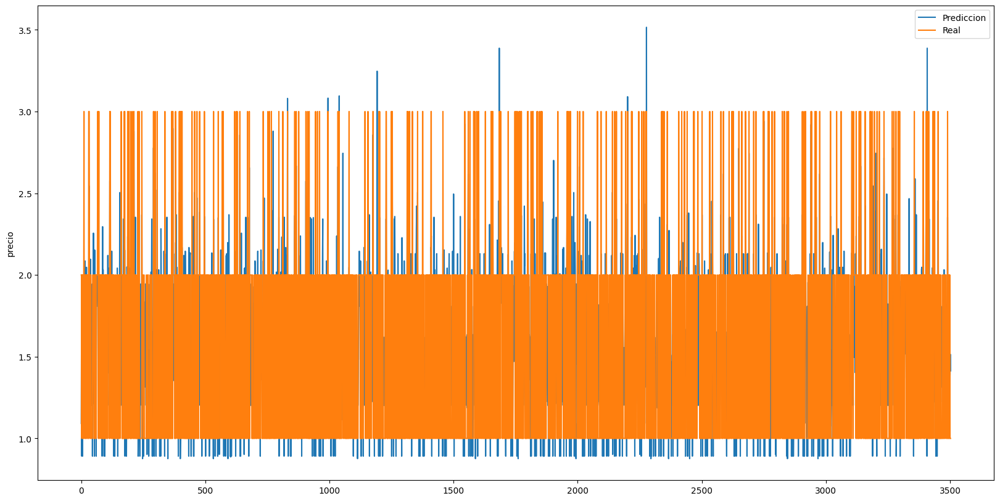

In [77]:
plt.figure(figsize = (20,10))

plt.plot(y_pred, label='Prediccion')
plt.plot(y_test.values, label='Real')

plt.ylabel('precio')

plt.legend()
plt.show()

In [78]:
df2['grade'] = df2['grade'].where(df2['grade'] <= 9, other=df2['grade'].median())
df2['grade'] = df2['grade'].where(df2['grade'] >= 6, other=df2['grade'].median())

In [79]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='grade', 
       title='grade')

In [80]:
df2['sqft_basement'] = df2['sqft_basement'].where(df2['sqft_basement'] <= 1400, other=df2['sqft_basement'].mean())

In [81]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='sqft_basement', 
       title='sqft_basement')

In [82]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='view', 
       title='view')

In [83]:
df.groupby('view')['view'].count()

view
0.0    15809
1.0     1702
Name: view, dtype: int64

In [84]:
df2.loc[df2.view==0,'view']=0
df2.loc[(df2.view>=1),'view']=1

In [85]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='bathrooms', 
       title='bathrooms')

In [86]:
df2.groupby('bathrooms')['bathrooms'].count()

bathrooms
0.00       4
0.50       3
0.75      60
1.00    3116
1.25       8
1.50    1206
1.75    2462
2.00    1570
2.25    1677
2.50    4361
2.75     985
3.00     609
3.25     474
3.50     585
3.75     121
4.00     112
4.25      67
4.50      85
4.75      16
5.00      18
5.25      12
5.50       8
5.75       3
6.00       4
6.25       1
6.50       2
7.50       1
8.00       2
Name: bathrooms, dtype: int64

In [87]:
df2.bathrooms=df2.bathrooms.round()

In [88]:
df2['bathrooms'] = df2['bathrooms'].where(df2['bathrooms'] <= 4, other=df2['bathrooms'].median())
df2['bathrooms'] = df2['bathrooms'].where(df2['bathrooms'] >= 1, other=df2['bathrooms'].median())

In [89]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='bedrooms', 
       title='bedrooms')

In [90]:
df2.groupby('bedrooms')['bedrooms'].count()

bedrooms
0.0        9
1.0      169
2.0     2221
3.0     7959
4.0     5649
5.0     1302
6.0      223
7.0       28
8.0        8
9.0        5
10.0       3
11.0       1
Name: bedrooms, dtype: int64

In [91]:
df2['bedrooms'].median()

3.0

In [92]:
df2['bedrooms'] = df2['bedrooms'].where(df2['bedrooms'] <= 5, other=df2['bedrooms'].median())
df2['bedrooms'] = df2['bedrooms'].where(df2['bedrooms'] >= 2, other=df2['bedrooms'].median())

In [93]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='sqft_above', 
       title='sqft_above')

In [94]:
df2['sqft_above'] = df2['sqft_above'].where(df2['sqft_above'] <= 3740, other=df2['sqft_above'].mean())

In [95]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='sqft_living15', 
       title='sqft_living15')

In [96]:
df2['sqft_living15'] = df2['sqft_living15'].where(df2['sqft_living15'] <= 3690, other=df2['sqft_living15'].mean())

In [97]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='floors', 
       title='floors')

In [98]:
df2.groupby('floors')['floors'].count()

floors
1.0    8698
1.5    1560
2.0    6673
2.5     126
3.0     507
3.5       7
Name: floors, dtype: int64

In [99]:
df2.floors=df2.floors.round()

In [100]:
df2['floors'] = df2['floors'].where(df2['floors'] <=3, other=df2['floors'].median())

In [101]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df2, x='sqft_living', 
       title='sqft_living')

In [102]:
px.box(df2, x='price', 
       title='price')

In [103]:
df2 = df2[df2['price'] <= 1130000]

In [104]:
df2[['price','grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors', 'sqft_living']].corr()

,price,grade,sqft_basement,view,bathrooms,bedrooms,sqft_above,sqft_living15,waterfront,floors,sqft_living
price,1.000000,0.470524,0.196508,0.232235,0.428233,0.284644,0.482736,0.526839,0.051130,0.271202,0.614643
grade,0.470524,1.000000,0.045903,0.119318,0.419886,0.280451,0.543350,0.512654,-0.001649,0.370236,0.519383
sqft_basement,0.196508,0.045903,1.000000,0.171255,0.257121,0.229563,-0.198100,0.083000,0.017514,-0.289025,0.298264
view,0.232235,0.119318,0.171255,1.000000,0.120680,0.042152,0.059335,0.183662,0.199146,-0.020195,0.165984
bathrooms,0.428233,0.419886,0.257121,0.120680,1.000000,0.426384,0.480088,0.411007,0.002661,0.310589,0.633167
bedrooms,0.284644,0.280451,0.229563,0.042152,0.426384,1.000000,0.458561,0.399985,-0.027786,0.167394,0.571785
sqft_above,0.482736,0.543350,-0.198100,0.059335,0.480088,0.458561,1.000000,0.674086,-0.002945,0.496549,0.793094
sqft_living15,0.526839,0.512654,0.083000,0.183662,0.411007,0.399985,0.674086,1.000000,0.003490,0.214362,0.701919
waterfront,0.051130,-0.001649,0.017514,0.199146,0.002661,-0.027786,-0.002945,0.003490,1.000000,-0.000569,0.004099
floors,0.271202,0.370236,-0.289025,-0.020195,0.310589,0.167394,0.496549,0.214362,-0.000569,1.000000,0.309016


In [105]:
df2[['price','grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_living15' ,'waterfront', 'floors', 'sqft_living']].isnull().sum()

price            0
grade            0
sqft_basement    0
view             4
bathrooms        0
bedrooms         0
sqft_living15    0
waterfront       4
floors           0
sqft_living      3
dtype: int64

In [106]:
df2['view'] = df2['view'].where(df2['view'] >=0, other=df2['view'].median())

C:\Users\scardona\AppData\Local\Temp\ipykernel_14940\3680001552.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [107]:
df2.groupby('view')['view'].count()

view
0.0    15277
1.0     1240
Name: view, dtype: int64

In [108]:
df2['waterfront'] = df2['waterfront'].where(df2['waterfront'] >=0, other=df2['waterfront'].median())

C:\Users\scardona\AppData\Local\Temp\ipykernel_14940\1913003671.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [109]:
df2.groupby('waterfront')['waterfront'].count()

waterfront
0.0    16464
1.0       53
Name: waterfront, dtype: int64

In [110]:
X = df2[['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors']]
Y = df2['price']



In [111]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [112]:
linear_model = LinearRegression(normalize=True).fit(x_train, y_train)
print('Puntaje de entrenamiento: ', linear_model.score(x_train, y_train))

Puntaje de entrenamiento:  0.4112584538303994


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





In [113]:
y_pred = linear_model.predict(x_test)
print('Puntaje de Testing: ', r2_score(y_test, y_pred))

Puntaje de Testing:  0.431997665666636


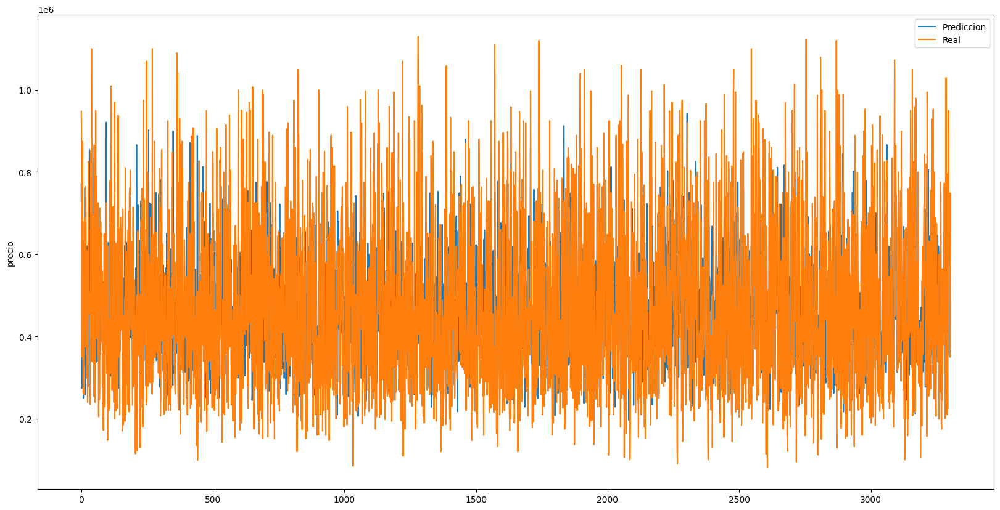

In [114]:
plt.figure(figsize = (20,10))

plt.plot(y_pred, label='Prediccion')
plt.plot(y_test.values, label='Real')

plt.ylabel('precio')

plt.legend()
plt.show()

In [173]:
column= ['price','grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors']

In [470]:
for x in column:
    q75,q25 = np.percentile(df.loc[:,x],[75,25])
    intr_qr = q75-q25
 
    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)
 
    df.loc[df[x] < min,x] = np.nan
    df.loc[df[x] > max,x] = np.nan
    
    print('la columna',x,"tiene un minimo de:",min,"y un maximo de:",max)

la columna price tiene un minimo de: -75000.0 y un maximo de: 981000.0
la columna grade tiene un minimo de: 5.5 y un maximo de: 9.5
la columna sqft_basement tiene un minimo de: -750.0 y un maximo de: 1250.0
la columna view tiene un minimo de: 0.0 y un maximo de: 0.0
la columna bathrooms tiene un minimo de: 0.625 y un maximo de: 3.625
la columna bedrooms tiene un minimo de: 1.5 y un maximo de: 5.5
la columna sqft_above tiene un minimo de: -165.0 y un maximo de: 3475.0
la columna sqft_living15 tiene un minimo de: 275.0 y un maximo de: 3515.0
la columna waterfront tiene un minimo de: 0.0 y un maximo de: 0.0
la columna floors tiene un minimo de: -0.5 y un maximo de: 3.5


In [471]:
df[column].isnull().sum()

price             250
grade            1555
sqft_basement     291
view             1702
bathrooms         232
bedrooms            0
sqft_above        249
sqft_living15     147
waterfront        127
floors              0
dtype: int64

In [472]:
df=df.dropna(subset=column)

In [473]:
df.shape

(14175, 23)

In [297]:
px.box(df, x='price', 
       title='price')

In [298]:
X = df[['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors']]
Y = df['price']

In [299]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [300]:
linear_model = LinearRegression(normalize=True).fit(x_train, y_train)
print('Puntaje de entrenamiento: ', linear_model.score(x_train, y_train))

Puntaje de entrenamiento:  0.12533994210202237


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





In [301]:
y_pred = linear_model.predict(x_test)
print('Puntaje de Testing: ', r2_score(y_test, y_pred))

Puntaje de Testing:  0.10691588176991684


In [39]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='price', 
       title='price') 

In [40]:
filter1=df[df['price']<= 1135250]['price'].mean()

In [41]:
 df.loc[df['price']>= 1135250,'price'] = filter1

In [42]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_basement', 
       title='sqft_basement') 

In [43]:
x='sqft_basement'
filter1=df[df[x]<=1400][x].mean()
df.loc[df[x]>= 1401,x] = filter1

In [44]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='bathrooms', 
       title='bathrooms') 

In [45]:
x='bathrooms'
filter1=df[(df[x]>=1)&(df[x]<=4)][x].median()
df.loc[df[x]>4,x] = filter1
df.loc[df[x]<1,x] = filter1

In [46]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='bedrooms', 
       title='bedrooms') 

In [47]:
x='bedrooms'
filter1=df[(df[x]>=2)&(df[x]<=5)][x].median()
df.loc[df[x]> 5,x] = filter1
df.loc[df[x]<2,x] = filter1

In [48]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_above', 
       title='sqft_above') 

In [49]:
x='sqft_above'
filter1=df[df[x]<=3720][x].mean()
df.loc[df[x]> 3720,x] = filter1

In [50]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_living15', 
       title='sqft_living15') 

In [51]:
x='sqft_living15'
filter1=df[df[x]<=3660][x].mean()
df.loc[df[x]> 3660,x] = filter1

In [52]:
#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_living', 
       title='sqft_living') 

In [53]:
df.shape

(17511, 23)

In [54]:
x='sqft_living'
filter1=df[df[x]<=4240][x].mean()
df.loc[df[x]> 4240,x] = filter1

In [55]:
X = df[['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors']]
Y = df['price']
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)
linear_model = LinearRegression(normalize=True).fit(x_train, y_train)
print('Puntaje de entrenamiento: ', linear_model.score(x_train, y_train))
y_pred = linear_model.predict(x_test)
print('Puntaje de Testing: ', r2_score(y_test, y_pred))

Puntaje de entrenamiento:  0.3590509065727967
Puntaje de Testing:  0.357657029544439


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





In [56]:
y_name = 'price'
x_names = ['grade', 'sqft_basement' ,'view', 'bathrooms' ,'bedrooms' ,'sqft_above' ,'sqft_living15' ,'waterfront', 'floors']

In [57]:

#['grade' 'sqft_basement' 'view' 'bathrooms' 'bedrooms' 'sqft_above'
 #'sqft_living15' 'waterfront' 'floors' 'sqft_living']
px.box(df, x='sqft_lot', 
       title='sqft_lot') 

In [58]:
x='sqft_lot'
filter1=df[df[x]<=17626][x].mean()
df.loc[df[x]> 17626,x] = filter1

In [61]:
result_dict = {}
def build_model(regression_fn,                
                name_of_y_col, 
                names_of_x_cols, 
                dataset, 
                test_frac=0.2,
                preprocess_fn=None):
    
    
    X = dataset[names_of_x_cols]
    Y = dataset[name_of_y_col]

    if preprocess_fn is not None:
        X = preprocess_fn(X)

    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=test_frac)
    
    model = regression_fn(x_train, y_train)
    y_pred = model.predict(x_test)
    
    print("Entrenamiento_score : " , model.score(x_train, y_train))
    print("Prueba_score : ", r2_score(y_test, y_pred))

    return {
            'Entrenamiento_score': model.score(x_train, y_train),
            'Prueba_score': r2_score(y_test, y_pred)
           }     

def compare_results():
    for key in result_dict:
        print('Regresion: ', key)
        print('Entrenamiento score', result_dict[key]['Entrenamiento_score'])
        print('Prueba score', result_dict[key]['Prueba_score'])
        print()

In [62]:
def linear_reg(x_train, y_train):
    model = LinearRegression(normalize=True)
    model.fit(x_train, y_train)
    
    return model
result_dict['price ~ single_linear'] = build_model(linear_reg,
                                                 'price',
                                                ['grade'],
                                                  df)

result_dict['price ~ kitchen_sink_linear'] = build_model(linear_reg,
                                                      'price',
                                                     ['bathrooms',
                                                      'bedrooms',
                                                      'sqft_lot',
                                                      'floors',
                                                      'grade'],
                                                      df)



Entrenamiento_score :  0.2805841308109217
Prueba_score :  0.2899567114019136
Entrenamiento_score :  0.30236338353927805
Prueba_score :  0.30754260906467756


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)



C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import ma

In [63]:
def lasso_reg(x_train, y_train, alpha=0.5):
    model = Lasso(alpha=alpha)
    model.fit(x_train, y_train)
    
    return model
result_dict['price ~ kitchen_sink_linear'] = build_model(lasso_reg,
                                                      'price',
                                                     ['bathrooms',
                                                      'bedrooms',
                                                      'sqft_lot',
                                                      'floors',
                                                      'grade'],
                                                      df)

Entrenamiento_score :  0.3099724401756838
Prueba_score :  0.27631414591852677


In [64]:
def ridge_reg(x_train, y_train, alpha=0.5, normalize=True):
    model = Ridge(alpha=alpha, normalize=normalize)
    model.fit(x_train, y_train)
    
    return model
result_dict['price ~ kitchen_sink_linear'] = build_model(ridge_reg,
                                                      'price',
                                                     ['bathrooms',
                                                      'bedrooms',
                                                      'sqft_lot',
                                                      'floors',
                                                      'grade'],
                                                      df)

Entrenamiento_score :  0.27564360138009314
Prueba_score :  0.28228677833773164


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 



In [68]:
def elastic_net_reg(x_train, y_train, alpha=1, l1_ratio=0.5, 
                    normalize=False, max_iter=100000, warm_start=True, equivalent_to="Elastic Net"):

    print("Equivalent to:", equivalent_to)
    
    model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, 
                       normalize=normalize, max_iter=max_iter, warm_start=warm_start)
    model.fit(x_train, y_train)

    return model
from functools import partial
result_dict['price ~ kitchen_sink_elastic_net_ols'] = build_model(partial(elastic_net_reg, 
                                                                        alpha=0, equivalent_to="OLS"),
                                                                 'price',
                                                     ['bathrooms',
                                                      'bedrooms',
                                                      'sqft_lot',
                                                      'floors',
                                                      'grade'],
                                                      df)

Equivalent to: OLS


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.

C:\Users\scardona\AppData\Local\Temp\ipykernel_12920\3084110419.py:8: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.



Entrenamiento_score :  0.30813026323842707
Prueba_score :  0.2826873345115972


C:\Users\scardona\Miniconda3\envs\jupyter\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.923e+14, tolerance: 5.560e+10 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.



In [65]:
def svr_reg(x_train, y_train, kernel='linear', epsilon=0.05, C=0.3):
    model = SVR(kernel=kernel, epsilon=epsilon, C=C)
    model.fit(x_train,y_train)
    
    return model
result_dict['price ~ kitchen_sink_svr'] = build_model(svr_reg,
                                                     'price',
                                                     ['bathrooms',
                                                      'bedrooms',
                                                      'sqft_lot',
                                                      'floors',
                                                      'grade'],
                                                      df)

Entrenamiento_score :  0.009338112001496368
Prueba_score :  0.008082884785816091


In [66]:
compare_results()

Regresion:  price ~ single_linear
Entrenamiento score 0.2805841308109217
Prueba score 0.2899567114019136

Regresion:  price ~ kitchen_sink_linear
Entrenamiento score 0.27564360138009314
Prueba score 0.28228677833773164

Regresion:  price ~ kitchen_sink_svr
Entrenamiento score 0.009338112001496368
Prueba score 0.008082884785816091



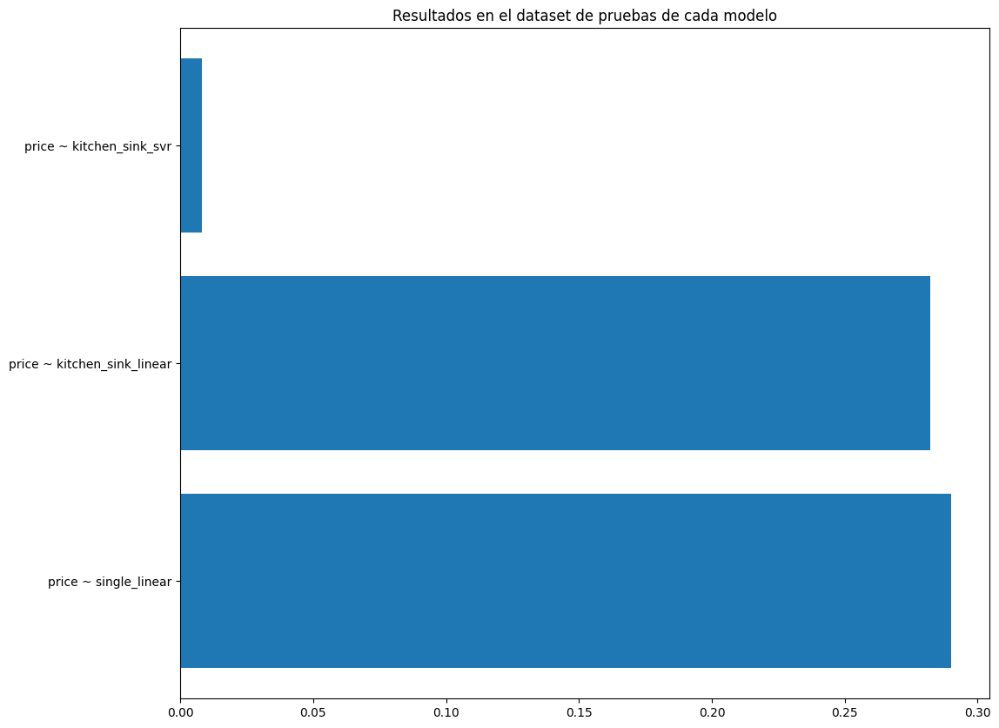

In [67]:
nombre_modelos = result_dict.keys()
resultados_prueba = {} # crear diccionario vacio
for nombre in nombre_modelos:
    resultados_prueba[nombre] = result_dict[nombre]['Prueba_score']
plt.figure(figsize = (12,10)) # tamaño de la figura
plt.barh(range(len(resultados_prueba)), list(resultados_prueba.values()), 
        align='center', );
plt.title("Resultados en el dataset de pruebas de cada modelo")
plt.yticks(range(len(resultados_prueba)), list(resultados_prueba.keys()));